# SkinAnaliticAI, Skin Cancer Detection with AI Deep Learning

## __Evaluation of Harvard Dataset with different AI classiffication techniques using FastClassAI papeline__
Author: __Pawel Rosikiewicz__   
prosikiewicz@gmail.com      
License: __MIT__    
ttps://opensource.org/licenses/MIT        
Copyright (C) 2021.01.30 Pawel Rosikiewicz 

# standard imports

In [1]:
import os # allow changing, and navigating files and folders, 
import sys
import shutil
import re # module to use regular expressions, 
import glob # lists names in folders that match Unix shell patterns
import numpy as np
import warnings
import pickle
import pandas as pd
import seaborn as sns # advance plots, for statistics, 
import matplotlib as mpl # to get some basif functions, heping with plot making 
import matplotlib.pyplot as plt # for making plots, 
from sklearn.model_selection import ParameterGrid
from tensorflow.keras.preprocessing.image import ImageDataGenerator
warnings.filterwarnings("ignore")

In [2]:
# setup basedir
basedir = os.path.dirname(os.getcwd())
os.chdir(basedir)
sys.path.append(basedir)

# project paths
PATH_raw                            = os.path.join(basedir, "data/raw")
PATH_interim                        = os.path.join(basedir, "data/interim")
PATH_models                         = os.path.join(basedir, "models")
PATH_interim_dataset_summary_tables = os.path.join(PATH_interim, "dataset_summary_tables") # create in that notebook,
PATH_results                        = os.path.join(basedir, "data/results")

# load functions
from src.utils.FastClassAI_skilearn_tools import train_skilearn_models_iteratively
from src.utils.FastClassAI_dense_nn_tools import train_dense_network_NN_models_iteratively
from src.utils.FastClassAI_model_summary_tools import load_summary_files
from src.utils.FastClassAI_model_summary_tools import create_new_df_feature
from src.utils.FastClassAI_model_summary_tools import simple_visual_model_summary
from src.utils.FastClassAI_model_summary_tools import prepare_summary_df
from src.utils.FastClassAI_model_summary_tools import create_boxplot_with_color_classes
from src.utils.FastClassAI_model_summary_tools import preapre_table_with_n_best_results_in_each_group

# load configs
from src.configs.project_configs import CLASS_DESCRIPTION # information on each class, including descriptive class name and diegnostic description - used to help wiht the project
from src.configs.tfhub_configs import TFHUB_MODELS # names of TF hub modules that I presenlected for featuress extraction with all relevant info,
from src.configs.dataset_configs import DATASET_CONFIGS # names created for clases, assigned to original one, and colors assigned to these classes
from src.configs.dataset_configs import CLASS_LABELS_CONFIGS # names created for clases, assigned to original one, and colors assigned to these classes
from src.configs.dataset_configs import DROPOUT_VALUE # str, special value to indicate samples to remoce in class labels
from src.configs.config_functions import DEFINE_DATASETS # function that creates datasunbsets collections for one dataset (custome made for that project)
from src.configs.model_parameters_configs import MODEL_PARAMETERS_GRID # dict, key: method name, value: ParameterGrid

In [25]:
# set project variables
DATASET_NAME          = "HAM10000"  # name used in config files to identify all info on that dataset variant
DATASET_VARIANTS      = DATASET_CONFIGS[DATASET_NAME]["labels"] # class labels that will beused, SORT_FILES_WITH   must be included
DATA_SUBSET_ROLES     = {
   'small_cnn_subset_data' :{
       "train" : 'trainvalid_small_cnn',
       "valid" : None, 
       "test"  : ['test', 'test_2']
   },
   'all_cnn_subset_data' :{
       "train" : 'trainvalid_all_cnn',
       "valid" : None, 
       "test"  : ['test', 'test_2']
   }    
}



#######################################################################################
#######################################################################################



# set general prameters, that are the same to all cycles and grid search functions
ai_methods           = list(MODEL_PARAMETERS_GRID.keys())
module_name          = None
grid_for_all_methods = MODEL_PARAMETERS_GRID
general_parameters   = dict(
    run_ID                  = "run01",
    save_path               = PATH_results,
    save_partial_results    = True,     
    unit_test               = False,
    verbose                 = True
) 

counter = 0
for ai_method in ai_methods:
    for dataset_variant in DATASET_VARIANTS:

        # define model paramters and input data ( some varinables depens on dataset varinat and tf hub model selected)
        model_parameters = dict(
                method_name                                 = ai_method,
                grid                                        = grid_for_all_methods[ai_method],                 
                models_selected_at_each_cycle               = 0.1,          # int, or float, if float, a top franction is used, if int, a top nr of models is used, 
                include_method_variant_with_model_selection = True, # bool, if True, top models_selected_at_each_cycle wiht different model variant will be selected to next cycle
                include_random_nr_with_model_selection      = False,     # bool, if True, top models_selected_at_each_cycle wiht different random nr will be selected to next cycle
                sort_models_by                              = "model_acc_valid"           # str {"model_acc_valid", "model_acc_train", "model_acc_test"}, in the future I will add other metrics 
                )
            
        input_data = dict(
                dataset_name            = DATASET_NAME,
                dataset_variant         = dataset_variant,
                module_name             = module_name,     
                path_data               = os.path.join(PATH_interim, f"{DATASET_NAME}__{dataset_variant}"),
                data_subsets_role       = DATA_SUBSET_ROLES,
                subset_collection_names = ["small_cnn_subset_data", "all_cnn_subset_data"], # sets the order  
                valid_proportion        = 0.3, # float, 0-1, on how much of the data shdould be randomly sorted into train subset, used only if valid datasusbet role is == None,  
                dropout_value           = None, 
                
            )
                
        # info:
        print(f"{counter}. Evaluating {len(grid_for_all_methods[ai_method])} {ai_method} models for:")
        print(f"   .... {dataset_variant}, {module_name} .... {input_data['subset_collection_names']}")  
        counter+=1
            
        if grid_for_all_methods[ai_method][0]['method_group'] == "denovo_cnn":
                
            print("ok")
            os.chdir(input_data["path_data"])
            print(input_data["path_data"])
                
                
                
                
            """
                train_denovoCNN_models_iteratively(
                        **general_parameters,
                        **model_parameters, 
                        **input_data
                        )
            """

        else:
            pass

0. Evaluating 1 cnn models for:
   .... Cancer_Detection_And_Classification, None .... ['small_cnn_subset_data', 'all_cnn_subset_data']
ok
/Users/pawel/Desktop/Activities/100__Projects/SkinDiagnosticAI/data/interim/HAM10000__Cancer_Detection_And_Classification
1. Evaluating 1 cnn models for:
   .... Cancer_Risk_Groups, None .... ['small_cnn_subset_data', 'all_cnn_subset_data']
ok
/Users/pawel/Desktop/Activities/100__Projects/SkinDiagnosticAI/data/interim/HAM10000__Cancer_Risk_Groups




..................................................
model_ID: 0
method_group: denovo_cnn
method: cnn
method_variant: res_64_pixels
............................... input data ...
run_name: test_run
dataset_name: HAM10000
dataset_variant: Cancer_Detection_And_Classification
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 16
img_size: (200, 200)
epoch: 100
Found 1188 images belonging to 7 classes.
Found 294 images belonging to 7 classes.
............................... input data - info df ...
         subset_dirname subset_results_name subset_role  \
0  trainvalid_small_cnn               train       train   
1                  None               valid       valid   
2               test_01                test        test   
3               test_02              test_2        test   

                                              status  
0                                            Loading  
1  0.2 of train - the same img augmentation appl

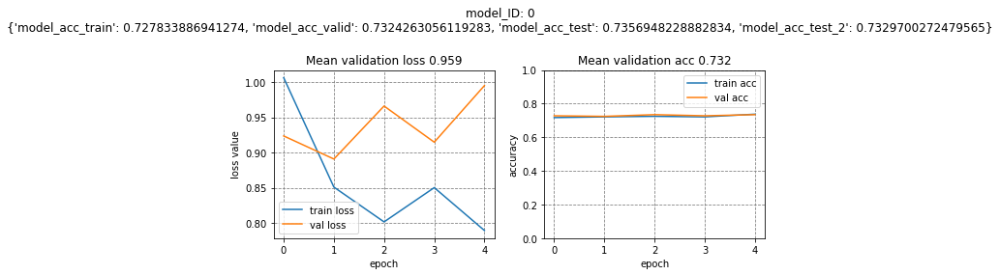

In [112]:
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import ParameterGrid
from sklearn.dummy import DummyClassifier
from sklearn.tree import DecisionTreeClassifier # accepts only numerical data
from sklearn.tree import export_graphviz
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import backend as K # used for housekeeping of tf models, 
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.decomposition import PCA
from tensorflow.keras import backend as K
from tensorflow.keras import Sequential
from tensorflow.keras import activations
from tensorflow.keras import initializers
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras import optimizers
from tensorflow.keras import losses
from tensorflow.keras import metrics
from tensorflow.keras import Sequential, activations, initializers
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score






# Function, ...........................................................................
def create_cnn_model(*, input_size, output_size, params, verbose=False):
    '''
        creeast simple sequential model
        params : dict with selected parameters and options used for model creation, 
    '''
        
    # Convolutional Network
    model = keras.Sequential()

    #.. 1st cnn, layer
    model.add(keras.layers.Conv2D(
            filters=64, 
            kernel_size=5, 
            strides=2,
            activation='relu', 
            input_shape=input_size 
            ))

    #.. maxpool 1.
    model.add(keras.layers.MaxPool2D(pool_size=2))

    #.. 2nd cnn layer, 
    model.add(keras.layers.Conv2D(
            filters=64, 
            kernel_size=3, 
            strides=1,
            activation='relu'
            ))

    #.. maxpool 2, 
    model.add(keras.layers.MaxPool2D(pool_size=2))

    #.. flat the results,
    model.add(keras.layers.Flatten())

    #.. hidden layer
    model.add(Dense(
            units=params["f1_units"], 
            activation="relu",
            #kernel_regularizer=tf.keras.regularizers.l2(0.001),
            kernel_initializer=initializers.TruncatedNormal(mean=0.0, stddev=0.01, seed=0)
        ))
    model.add(tf.keras.layers.Dropout(params["f1_dropout"]))

    #.. output nn, 
    model.add(keras.layers.Dense(
            units=output_size, 
            activation='softmax'
            ))

        # compile, 
    model.compile(optimizer=params["optimizer"], loss='categorical_crossentropy', metrics=['acc'])
        
        
    # create callback function, 
    callback_function = keras.callbacks.EarlyStopping(monitor='val_loss', patience=params["early_strop"])
        
        
    if verbose==True:
        model.summary()    
    else:
        pass
        
    return model, callback_function
    
    
    

    
    

    
    

# Function, ................................................................................       
def plot_NN_loss_acc(*, model_history_df, title="", n_mean=3, figsize=(8,4), top=0.75):
    ''' small function to plot loss and accuracy over epoch using data created with history.history() keras functions, 
        the columns shodul be called acc, loss, and val_acc, val_loss, 
        # ...
        . model_history_df   : dataframe, created with history.history() keras functions (see in the above)
        . n_mean             : int, how many last results use to caulate values displayed in suplot title
        . title.             : str, plot title, 
    '''
    #.. figure, axes, 
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=figsize)
    fig.suptitle(title)

    #.. Plot accuracy values
    ax1.plot(model_history_df.loc[:,'loss'], label='train loss')
    ax1.plot(model_history_df.loc[:,'val_loss'], label='val loss')
    ax1.set_title('Mean validation loss {:.3f}'.format(np.mean(model_history_df.loc[:, 'val_loss'][-n_mean:])))
    ax1.set_xlabel('epoch')
    ax1.set_ylabel('loss value')
    ax1.grid(ls="--", color="grey")
    ax1.legend()

    #.. Plot accuracy values
    ax2.plot(model_history_df.loc[:, 'acc'], label='train acc')
    ax2.plot(model_history_df.loc[:, 'val_acc'], label='val acc')
    ax2.set_title('Mean validation acc {:.3f}'.format(
    np.mean(model_history_df.loc[:, 'val_acc'][-n_mean:])))
    ax2.set_xlabel('epoch')
    ax2.set_ylabel('accuracy')
    ax2.set_ylim(0,1)
    ax2.grid(ls="--", color="grey")
    ax2.legend()
    
    # ... 
    plt.tight_layout()
    plt.subplots_adjust(top=top)
    plt.show()

    
    
    
    
    
    
    
    
    
# Function, ........................................................................    
def deNovoCNN_gridsearch(*,        
        
        # ... model/run description 
        method,
        run_name,
        dataset_name,
        dataset_variant,
        module_name,
        
        # input data,
        cnn_model_function,
        grid,
        path,               # path to data
        input_data_info_df=None, # df, with 3. columns, 
        unit_test = False,   
                         
        # options, 
        default_validation_split=0.2,  # float, used only if this value is not provided in input_data_info_df or validation_split pramatere in 
        datagen_params = dict(rescale =1/255), # dict, for keras imagedatagenerator, used only if not provided with parameter grid,     
                         
        # info, 
        verbose=False, # detailed info, 
        plot_history=True, # bool, if True, returns basic inof on each model, training progres and 
        model_fit_verbose=1,                 
    ):
    """
        this funciton will load raw images 
    
        Limitations, 
        because we are creating valid dataset as subset of train data with image data generators, 
        these must be done using the same image generator (or else it will return Value Err after 1st epoch)
        from that reason, validaiton data have the same transformations as train data, and return typically lower acc values as 
        the tests done with other technicques and pielines, 
    """    
      
    
    # Set up, ............................................................................. 
       
    #.. variables,
    model_ID = -1   # to start usnique counts of the models from 0 
    colname_with_classname_in_batch_labels_table = "classname"
    
    #.. objects to store the results, 
    model_acc_and_parameters_list = list()
    model_predictions_dict        = dict()
    model_parameters_dict         = dict() # for iterations from grid
    model_history_dict            = dict()
    
    # worn on input_data_info_df
    if input_data_info_df is None:
        input_data_info_df = pd.DataFrame([
            {
                 "subset_role":  "train",
                 "subset_results_name": "train",
                 "subset_dirname": "train"
            },
            {
                 "subset_role":  "valid",
                 "subset_results_name": "valid",
                 "subset_dirname": None     
            },
            {
                 "subset_role":  "test",
                 "subset_results_name": "test",
                 "subset_dirname": "test"     
            }
        ])    
    else:
        pass      

    
    #.. 
    if unit_test==True:
        subset_dirname_to_use_for_unit_test = input_data_info_df.subset_dirname.iloc[0]
        input_data_info_df.subset_dirname = subset_dirname_to_use_for_unit_test
    else:
        pass
        
    
    # for loop for grid serch wiith each parameter combination,, ............................... 
    for params_i, params in enumerate(grid):
        model_ID +=1
        
        # add or reset status column un info df, 
        input_data_info_df["status"]="loaded after training"

        #.. plot history, 
        '''
            printed here, so you know what data are being loaded with image generators, 
        '''
        if plot_history==True:
            print(f"\n\n..................................................")
            print(f"model_ID: {model_ID}")
            print(f"method_group: {params['method_group']}")
            print(f"method: {method}")
            print(f"method_variant: {params['method_variant']}")
            print(f"............................... input data ...")
            print(f"run_name: {run_name}")
            print(f"dataset_name: {dataset_name}")
            print(f"dataset_variant: {dataset_variant}")
            print(f"unit_test: {unit_test}")
            print(f"............................... basic params ...")
            print(f"random_state_nr: {params['random_state_nr']}")            
            print(f"batch_size: {params['batch_size']}") 
            print(f"img_size: {params['img_size']}") 
            print(f"epoch: {params['epoch']}") 
        else:
            pass        
   
        # set parameters for 
        try:
            train_datagen_params = params["train_datagen_params"]
            valid_datagen_params = params["valid_datagen_params"]
            test_datagen_params  = params["test_datagen_params"]
            datagen_params_info = "imgadatagen prams provided by the user"
        except:
            train_datagen_params = datagen_params
            valid_datagen_params = datagen_params
            test_datagen_params = datagen_params   
            datagen_params_info = "using default imgadatagen params"
        
        # load train & valid data
        if unit_test==True:
            valid_datagen_params = train_datagen_params
            test_datagen_params  = train_datagen_params        
        else:
            pass    
        
        # dirnames (only one dirname is allowed with generaqtors,)
        train_subset_dirname = input_data_info_df.subset_dirname.loc[input_data_info_df.subset_role=="train"].iloc[0]
        valid_subset_dirname = input_data_info_df.subset_dirname.loc[input_data_info_df.subset_role=="valid"].iloc[0] # not used at this moment, 

    
        # OPTION 1, subset valid data from train data 
        if valid_subset_dirname is None or isinstance(valid_subset_dirname, float):
            # set-up directory names and datagen parameters, 
            if isinstance(valid_subset_dirname, float):
                train_datagen_params["validation_split"]=valid_subset_dirname
                
            # else its None, so we have to get validaiton split value from somewhere, 
            else:
                try:
                    train_datagen_params["validation_split"] #KeyError if it is missing, 
                except:
                    train_datagen_params["validation_split"]=default_validation_split
                
            train_datagen  = ImageDataGenerator(**train_datagen_params)
            TRAINING_DIR   = os.path.join(path, train_subset_dirname)
            VALIDATION_DIR = TRAINING_DIR
            
            # update, status:
            input_data_info_df.loc[input_data_info_df.subset_role=="train", "status"] = "Loading"
            input_data_info_df.loc[input_data_info_df.subset_role=="valid", "status"] = f"{train_datagen_params['validation_split']} of train - the same img augmentation applied as to train data"

            #.. for train dataset
            trainset = train_datagen.flow_from_directory(
                TRAINING_DIR, 
                batch_size     =params["batch_size"], 
                target_size    =params["img_size"],
                shuffle        =True,
                subset         ="training"
            )

            #.. for validation data, no shuffle, made from the same dataset as train data, 
            validset = train_datagen.flow_from_directory(
                VALIDATION_DIR, 
                batch_size     =params["batch_size"], 
                target_size    =params["img_size"],
                shuffle        =False,
                subset         ="validation"
            )
            
        else:           
            #.. create image generator, validation_split=params["validation_split"]
            train_datagen  = ImageDataGenerator(**train_datagen_params)
            valid_datagen  = ImageDataGenerator(**valid_datagen_params)     
            
            TRAINING_DIR   = os.path.join(path, train_subset_dirname)
            VALIDATION_DIR = os.path.join(path, valid_subset_dirname)
            
            # update, status:
            input_data_info_df.loc[input_data_info_df.subset_role=="train", "status"] = "Loading"
            input_data_info_df.loc[input_data_info_df.subset_role=="valid", "status"] = "Loading"

            #.. for train dataset
            trainset = train_datagen.flow_from_directory(
                TRAINING_DIR, 
                batch_size     =params["batch_size"], 
                target_size    =params["img_size"],
                shuffle        =True
            )

            #.. for validation data, no shuffle, made from the same dataset as train data, 
            validset = valid_datagen.flow_from_directory(
                VALIDATION_DIR, 
                batch_size     =params["batch_size"], 
                target_size    =params["img_size"],
                shuffle        =False
            )


        # Collect class encoding/decoding - its not the standard one, .....................
        class_encoding  = trainset.class_indices
        class_decoding  = dict(zip(list(class_encoding.values()),list(class_encoding.keys())))

        
        
        # add some info:
        if plot_history==True:
            print(f"............................... input data - info df ...")
            print(input_data_info_df)
            print(f"..................................................\n")
        else:
            pass        

    
        
        
        # train the model, collect the results, and plot history, .........................
        
        #.. create the model,  
        model, callback_function =  cnn_model_function(
            input_size=(params["img_size"][0], params["img_size"][1], 3), 
            output_size=trainset.num_classes, 
            params=params,
            verbose=False
        )
        
        #.. train the model
        history = model.fit_generator(
            generator        =trainset,          # you provide iterators, instead of data, 
            validation_data  =validset, 
            epochs           =params["epoch"], 
            callbacks        =[callback_function],   # functions that can be applied at diffeerent stages to fight overfitting, 
            verbose          =model_fit_verbose
        )
        
        #.. store the results,
        model_acc   = dict()
        model_loss    = dict()
        n           = 3 # use last 3 results in history, 
        acc_results = pd.DataFrame(history.history).iloc[-n::,:].mean(axis=0)
        model_acc["model_acc_train"]      = acc_results.loc["acc"]  
        model_acc["model_acc_valid"]      = acc_results.loc["val_acc"]
        model_loss["loss_acc_train"]      = acc_results.loc["loss"]
        model_loss["loss_acc_valid"]      = acc_results.loc["val_loss"]             
          
 
        # LOAD TEST DATA and store all sort of data in the last loop !, .........................

        # prepare objects to store results,  
        baseline_acc              = dict()
        one_model_predictions     = dict() # with predictions collected for each subset separately, 
        # it will be used temporaly, untul the last chunk of code to reload model predictions to final location

        
        # first, chek if test data were provided, 
        if (input_data_info_df.subset_role=="test").sum()==0:
            pass
        
        else:
            # get df subset with test data 
            test__input_data_info_df = pd.DataFrame(input_data_info_df.loc[input_data_info_df.subset_role=="test",:])
            test__input_data_info_df.reset_index(inplace=True, drop=True)
            # now check if there is anythign to load, and pass if None, 
            if test__input_data_info_df.shape[0]==1 and test__input_data_info_df.subset_dirname.iloc[0] is None:
                pass
            else:    
                
                # loop over each row, 
                print(f"generating predicitons for test data: {test__input_data_info_df.shape[0]} subsets")
                for test_subset_nr in range(test__input_data_info_df.shape[0]):

                    # load the dataset, 
                    one_test_xy_name             = test__input_data_info_df.subset_results_name.iloc[test_subset_nr]
                    one_test_subset_name_to_load = test__input_data_info_df.subset_dirname.iloc[test_subset_nr] 
                
                    #.. generator for test data
                    test_datagen  = ImageDataGenerator(**test_datagen_params)

                    #.. find how many images there are
                    temp_testset  = test_datagen.flow_from_directory(
                        os.path.join(path, one_test_subset_name_to_load),
                        batch_size     =params["batch_size"],
                        target_size    =params["img_size"],
                        shuffle        =False
                        )

                    #.. get all images in one batch, 
                    test_img_number = len(temp_testset.filenames)
                    testset         = test_datagen.flow_from_directory(
                        os.path.join(path, one_test_subset_name_to_load),
                        batch_size     =test_img_number,
                        target_size    =params["img_size"],
                        shuffle        =False
                        )  

                    # calculate test set accuracy, 

                    #.. get predictions (in dummy array)
                    test_preds = model.predict_generator(testset)
                    y_true     = testset.classes # array with true labels
                    y_pred     = test_preds.argmax(axis=1) # array with predicted labels
                    model_acc[f"model_acc_{one_test_xy_name}"]  = accuracy_score(y_true, y_pred)
                    model_loss[f"model_loss_{one_test_xy_name}"]= np.nan

                    #.. caulate test set baseline
                    baseline_acc[f"baseline_acc_{one_test_xy_name}"] = pd.Series(y_true).value_counts(normalize=True).sort_values(ascending=True).iloc[0]

                    #.. store model predictions, 
                    predictions                 = y_pred
                    decoded_predictions         = pd.Series(y_pred).map(class_decoding).values
                    model_predictions_proba     = test_preds
                    decoded_y_labels            = pd.Series(y_true).map(class_decoding).values
                    batch_labels_df             = pd.DataFrame(testset.filenames, columns=["imgname"])
                    batch_labels_df["clasname"] = decoded_y_labels # miniversiton with 2 most importnat columns
                    #..
                    one_model_predictions[one_test_xy_name] = {
                            "idx_in_batch":            np.arange(batch_labels_df.shape[0]),
                            "original_labels":         decoded_y_labels, 
                            "model_predictions":       decoded_predictions, 
                            "model_predictions_proba": model_predictions_proba,
                            "acc_restuls_and_params":  None, # will be added later on
                            "class_encoding":          class_encoding,
                            "class_decoding":          class_decoding,
                            "batch_labels_df":         batch_labels_df["clasname"],
                            "knn_kneighbors":          None
                    }# added, in case I woudl have some dounbts about results origine, 

            

        # Collect more results, including lists that were created over each test subset..................            

        # - 1 - collect acc_restuls_and_params
        acc_restuls_and_params = {
                         "model_ID": model_ID,
                         "run_name": run_name,
                         "method": method,
                         "dataset_name": dataset_name, 
                         "dataset_variant": dataset_variant,
                         "module": module_name,
                         "unit_test":unit_test,
                         # ....
                         **baseline_acc,
                         **model_acc,
                         **model_loss,       # nn only 
                         **params,
                         "pca_components_used":0
        }
        model_acc_and_parameters_list.append(acc_restuls_and_params) # in list, so it can be used as pd.df immediately, 
           
        # - 2 - save model history, 
        model_history_dict[model_ID] = {
            "model_history": pd.DataFrame(history.history),
            "acc_restuls_and_params":  acc_restuls_and_params
            }

        # - 3 - store params, 
        "to allow future runs"
        model_parameters_dict[model_ID] = {
            "acc_restuls_and_params":  acc_restuls_and_params,  # when added, I can easily control what I am selecting in other 
            "params":params
            } 
 
        # - 4- add acc_restuls_and_params to each model prediction, and store them in the dict with model ID 
        for one_test_xy_name in list(one_model_predictions.keys()):    
            one_model_predictions[one_test_xy_name]['acc_restuls_and_params'] = acc_restuls_and_params
        
        # and finally, add this to the big dict wiht all the results, 
        model_predictions_dict[model_ID] = one_model_predictions 

        
        
        
        # Report on results, .....................................................................
        
        #.. plot history, 
        if plot_history==True:
            plot_NN_loss_acc(
                model_history_df=pd.DataFrame(history.history), 
                title=f"model_ID: {model_ID}\n{model_acc}", 
                n_mean=3, 
            )
        else:
            pass        
        
        
    # ..................................................
    return model_acc_and_parameters_list, model_predictions_dict, model_parameters_dict, model_history_dict,



            
 


















                              
DATASET_NAME          = "HAM10000"  # name used in config files to identify all info on that dataset variant
DATASET_VARIANTS      = DATASET_CONFIGS[DATASET_NAME]["labels"] # class labels that will beused, SORT_FILES_WITH   must be included
MODULE_NAME           = None

train_datagen_params = dict(
        rescale =1/255,
        height_shift_range=0.1,
        width_shift_range=0.1,
        horizontal_flip=True,
        fill_mode="nearest",
        rotation_range=30,
        brightness_range=[0.2,1.8], 
        zoom_range=[0.75,1.25], # ±25%
        channel_shift_range=.1,
        validation_split=0.3   ###################### important           
    )

train_datagen_params = dict(rescale =1/255)
valid_datagen_params = dict(rescale =1/255)
test_datagen_params = dict(rescale =1/255)

MODEL_PARAMETERS_GRID = {
    "cnn" : ParameterGrid([
        {   
            # parameters for keras image generators,
            'train_datagen_params': [train_datagen_params],
            'valid_datagen_params': [train_datagen_params],
            'test_datagen_params': [train_datagen_params],
            # input data and model names, 
            'method_group':   ["denovo_cnn"],      # for all classical models, 
            'method_variant': ['res_64_pixels'],    # eg: SVM has linear or rbf, or typically pca or not, (nothing)
            'random_state_nr':[0],                  # in the list
            #'pc': [['n_neighbors', 'weights', 'p']] # unused with cnn
            "batch_size": [16],
            "img_size":  [(200, 200)],
            # ........................
            "f1_units":  [100],
            "f1_dropout":[0],
            "optimizer": ["Adam"],
            # ........................
            "epoch": [100],
            "early_strop": [3]   
        }
        ]) 
    }
ai_method = "cnn"
grid = MODEL_PARAMETERS_GRID[ai_method]
dataset_name = DATASET_NAME
dataset_variant = DATASET_VARIANTS[0]
path = os.path.join(PATH_interim, f"{dataset_name}__{dataset_variant}")
CNN_DF_INFO = pd.DataFrame([
    {
         "subset_role":  "train",
         "subset_results_name": "train",
         "subset_dirname": "trainvalid_small_cnn"
    },
    {
         "subset_role":  "valid",
         "subset_results_name": "valid",
         "subset_dirname": None   
    },
    {
         "subset_role":  "test",
         "subset_results_name": "test",
         "subset_dirname": "test_01"     
    },
    {
         "subset_role":  "test",
         "subset_results_name": "test_2",
         "subset_dirname": "test_02"     
    }
])           
  
_ ,_ , _ , _= deNovoCNN_gridsearch(        
        # model/run description 
        method             = ai_method,
        run_name           = "test_run",
        dataset_name       = dataset_name,
        dataset_variant    = dataset_variant,
        module_name        = None,
        
        # input data,
        cnn_model_function = create_cnn_model,
        grid               = grid,
        path               = path, # path to dir with data subsets in separate folders for train, test ect...
        input_data_info_df = CNN_DF_INFO, # df, with 3. columns, subset_role/results_name/dirname
              
        # results and info, 
        verbose=False,
        plot_history=True
    )        
            
            
            
            


In [102]:
a = dict(a=2)

In [106]:
try:
    a["b"]
except:
    print("ok")

ok


# second approach ::::::::

In [ ]:





# Function, .................................................
def train_denovoCNN_models_iteratively(*,

    # names  
    run_ID,            # str, Unique ID added to name of each file to allow running and saving similar module create with different parameters or different data
    dataset_name,      # str, global, provided by the wrapper function,
    dataset_variant,   # str, global, provided by the wrapper function,
    module_name,       # str, global, provided by the wrapper function,                                  
                  
    # define input data,
    subset_collection_names,            # list, anything that will allow you to identify which subset and run you are using             
    data_subsets_role,                  # dict, with names of subsets used as train, valid and test + in case you wish to use
    path_data,                          # used only with denovo cnn, 
                                       
    # model parameters,
    method_name,       # str, keywod in the function {knn, svm, logreg, dt, rf}
    grid,              # ParameterGrid object, wiht parameters for a given function, 
            
    # model selection cycles,                       
    models_selected_at_each_cycle = 0.3,          # int, how many models with best performace will be selected and trained with another round of training and with next subset collection 
    include_method_variant_with_selection = True, # bool, if True, top models_selected_at_each_cycle wiht different model variant will be selected to next cycle
    include_random_nr_with_selection = False,     # bool, if True, top models_selected_at_each_cycle wiht different random nr will be selected to next cycle
    sort_models_by = "model_acc_valid",           # str {"model_acc_valid"} 
                                  
    # saving
    save_path,             # str, eg PATH_results from configs 
    save_partial_results=True, # bool, if True, it will save model results at each iteration
                                  
    # pipe variables, # same for all cycles,                              
    class_encoding,        # dict, global key: class_name, value:int 
    class_decoding,        # dict, global key: int, value:class_name
    valid_proportion=0.3,  # used only if validation datasets is not specified, 
    dropout_value=None,    # str, from configs, 
    unit_test=False,
  
    # other, 
    plot_history=True, # plots accuracy and error over epohs for each nn
    verbose=True
):

    
    
    # ** / options 
    'applied only if subset roles, valid ==None'
    train_proportion = 1-valid_proportion # because I used that value before, 
    
    #...
    if verbose==True:
        display_partial_results=True
    else:
        display_partial_results=False

    # create path for results wiht all options, 
    path_results = os.path.join(save_path, f"{method_name}__{dataset_name}__{dataset_variant}")
    try: 
        os.mkdir(path_results)
        if verbose==True:
            print(f"\n Crated: {path_results}\n")
        else:
            pass
    except: 
        pass
    
        

        
    # ** / grid search       
    run_names = list()
    for cycle_nr, subset_collection_name in enumerate(subset_collection_names):
        
        
        print(f"\n - - - CYCLE: {cycle_nr} - - -\n")
        
        
        # ...............................................
        # get df with path and filenames to load
        
        # set unique run name, 
        run_name = f"{subset_collection_name}__{run_ID}"
        run_names.append(run_name)
        
        # set name added to each saved file wiht results from that cycle
        file_name_fingerprint = f'{method_name}__{dataset_name}__{dataset_variant}__{module_name}__{run_name}'
        
        # set role for each subset (train, valid, test wiht the names of the corresponding files)
        selected_data_subsets_role = data_subsets_role[subset_collection_name].copy()
        
        # check if validation dataset is available, 
        if isinstance(selected_data_subsets_role["valid"], float):
            train_proportion_applied = 1-selected_data_subsets_role["valid"] 
            selected_data_subsets_role["valid"] = None
        else:
            train_proportion_applied = train_proportion # used, only if there will be None for valid role, 
        
        
        
        
        # ...............................................
        # find grid with parameters
        if cycle_nr==0:
            "the grid is provided externally in 0 cycle"
            cycle_grid = grid
            
        else:
            "here you must collect parameters from the best performing models, and extract params for top nr of them"
            "options to include model variant in selection"
            sort_by = "model_acc_valid"
            

            # collect features you want to use to sort model results and get top of each of them
            features_used_to_group_models = ["method", "dataset_name", "dataset_variant", "module"]
            if include_random_nr_with_selection==True:
                features_used_to_group_models.append("random_state_nr")
            else:
                pass
            if include_method_variant_with_selection:
                features_used_to_group_models.append("method_variant")
            else:
                pass    

            # add these features to df, with the model results as one column
            for fi, feature in enumerate(features_used_to_group_models):
                if fi==0:
                    composite_feature = results_from_last_cycle.loc[:, feature].values.tolist()
                else:
                    composite_feature = [f"{x}__{y}" for (x,y) in zip(composite_feature, 
                                        results_from_last_cycle.loc[:, feature].values.tolist())]
            results_from_last_cycle["method_full_name"] = composite_feature
            

            
            # find best performing models in each group and sort them    
            method_groups    = results_from_last_cycle.method_full_name.unique().tolist()
            best_methods_IDs = list()
            for ii, mg in enumerate(method_groups):

                # subset summary_df for each method group
                df_subset =  results_from_last_cycle.loc[ results_from_last_cycle.method_full_name==mg, :]
                df_subset = df_subset.sort_values(sort_by, ascending=False)
                df_subset.reset_index(inplace=True, drop=True)

                # find how many models will be selected for the next cycle,
                if models_selected_at_each_cycle<1 and models_selected_at_each_cycle>0:
                    mnr = int(np.ceil(df_subset.shape[0]*models_selected_at_each_cycle))
                    
                elif models_selected_at_each_cycle==0:
                    mnr = 1
                    
                else:
                    mnr = models_selected_at_each_cycle

                # because I had some rare situations with problems,
                if mnr==0:
                    mnr=1
                else:
                    pass    

                # find top n models in each
                best_methods_IDs.extend(df_subset.model_ID.values[0:mnr].tolist()) #this will extend the list by each nr of id numbers
                
                
            # create new grid
            cycle_grid=list()
            for gidx in best_methods_IDs:
                cycle_grid.append(model_parameter_list[gidx]['params']) # yes its 'para  ms'! its a mistake, that I have no time to correct 

              
            
            
            
            
                
                
                
        # train models
        results_list, model_predictions_dict, model_parameter_list, model_history_dict = CNN_GridSearch(
                # input data
                method                = method_name, 
                grid                  = cycle_grid,
                file_namepath_table   = subset_collection_composition_df,            

                # names to safe, used to identify input data & results
                dataset_name          = dataset_name,
                dataset_variant       = dataset_variant,
                module_name           = module_name,     
                run_name              = run_name,            

                # names used to search for subset names and save results
                class_encoding        = class_encoding,
                class_decoding        = class_decoding,
                dropout_value         = dropout_value, 
                train_subset_name     = selected_data_subsets_role["train"],                    # because I donth have to call that train in my files, 
                valid_subset_name     = selected_data_subsets_role["valid"],                    # if None, train_proportion will be used
                test_subset_name_list = selected_data_subsets_role["test"],                     # must correspond to subset_name in file_namepath_table if None, the loist is simply shorter, 
                unit_test             = unit_test,
                train_proportion      = train_proportion_applied, # not available in that version, I would like to make it possible next version

                # ... results and info, 
                store_predictions=True,
                track_progres=display_partial_results,   
                plot_history=plot_history, # applied only if verbose==True
                model_fit__verbose=0,
                verbose=False            
            )
            
      
    

        # this is for the next cylce
        results_from_last_cycle = pd.DataFrame(results_list)

        # ** / save the results, 
        if save_partial_results==True:
            save_te_results=True
        else:
            if cycle_nr==(len(subset_collection_names)-1):
                save_te_results=True
            else:
                save_te_results=False
            
            
        # create path for results
        if save_te_results==True:
            os.chdir(path_results)

            if verbose==True:
                print(f"The results will be saved with as:\n{file_name_fingerprint}")
            else:
                pass

            # save results and metadata on each model, 
            pd.DataFrame(results_list).to_csv(f"{file_name_fingerprint}__summary_table.csv", header=True)

            # save model predictions, 
            with open(f"{file_name_fingerprint}__model_predictions_dict.p", 'wb') as file: # wb - write binary,
                pickle.dump(model_predictions_dict, file) 

            # save model parameters to re-run the models
            with open(f"{file_name_fingerprint}__model_parameters_list.p", 'wb') as file: # wb - write binary,
                pickle.dump(model_parameter_list, file) 
                

            # save history_dict to re-run the models - speciffic for tf models 
            with open(f"{file_name_fingerprint}__model_history_dict.p", 'wb') as file: # wb - write binary,
                pickle.dump(model_history_dict, file)                 
                
                
        else:
            if verbose==True:
                print(f"The results for this cycle were not saved, only final results are going to be saved")
            else:
                pass            
            pass


        
# Function, ...........................................................................
def create_cnn_model(**, input_size, output_size, params, verbose==False):
        '''
            creeast simple sequential model
            params : dict with selected parameters and options used for model creation, 
        '''
        
    # Convolutional Network
    model = keras.Sequential()

    #.. 1st cnn, layer
    model.add(keras.layers.Conv2D(
            filters=64, 
            kernel_size=5, 
            strides=2,
            activation='relu', 
            input_shape=input_size 
            ))

    #.. maxpool 1.
    model.add(keras.layers.MaxPool2D(pool_size=2))

    #.. 2nd cnn layer, 
    model.add(keras.layers.Conv2D(
            filters=64, 
            kernel_size=3, 
            strides=1,
            activation='relu'
            ))

    #.. maxpool 2, 
    model.add(keras.layers.MaxPool2D(pool_size=2))

    #.. flat the results,
    model.add(keras.layers.Flatten())

    #.. hidden layer
    model.add(Dense(
            units=params["f1_units"], 
            activation="relu",
            #kernel_regularizer=tf.keras.regularizers.l2(0.001),
            kernel_initializer=initializers.TruncatedNormal(mean=0.0, stddev=0.01, seed=0)
        ))
    model.add(tf.keras.layers.Dropout(params["f1_dropout"]))

    #.. output nn, 
    model.add(keras.layers.Dense(
            units=output_size, 
            activation='softmax'
            ))

        # compile, 
    model.compile(optimizer=params["optimizer"], loss='categorical_crossentropy', metrics=['acc'])
        
        
    # create callback function, 
    callback_function = keras.callbacks.EarlyStopping(monitor='val_loss', patience=params["early_strop"])
        
        
    if verbose==True:
        model.summary()    
    else:
        pass
        
    return model, callback_function
    
    
    

    
    

    
    
# Function, ........................................................................    
def deNovoCNN_gridsearch(*,        
        
        # ... model/run description 
        method,
        run_name,
        dataset_name,
        dataset_variant,
        module_name,
        
        # input data,
        cnn_model_function,
        grid,
        path,                   # path to data
        subset_roles_and_dirnames=None, # df, with 3. columns, 
              
        # results and info, 
        store_predictions=True,
        track_progres=True,  
        verbose=True,
        plot_history=True,
        model_fit_verbose=1
    ):
    """
        this funciton will load raw images 
    
    
    """    
    # Set up, ............................................................................. 
    
    #.. variables,
    model_ID = -1   # to start usnique counts of the models from 0 
    colname_with_classname_in_batch_labels_table = "classname"
    
    #.. objects to store the results, 
    model_acc_and_parameters_list = list()
    model_predictions_dict        = dict()
    model_parameters_dict         = dict() # for iterations from grid
    model_history_dict            = dict()
    
    #.. params,
    train_datagen_params = dict(
        rescale =1/255,
        height_shift_range=0.1,
        width_shift_range=0.1,
        horizontal_flip=True,
        fill_mode="nearest",
        rotation_range=30,
        brightness_range=[0.2,1.8], 
        zoom_range=[0.75,1.25], # ±25%
        channel_shift_range=.1,
        validation_split=0.3.   ###################### important           
    )
    valid_datagen_params = dict(rescale =1/255)
    test_datagen_params = dict(rescale =1/255)
    
    # datasubsets, 
    train_subset_name     = data_subsets_role["train"]
    valid_subset_name     = data_subsets_role["valid"]
    test_subset_name_list = data_subsets_role["test"]
    
    # xy_names, names used in the dataframe with the results, so everything is standarized, 
    xy_names = ["train", "valid", "test", "test_2"] # for now, 
    
    
    
    
    # for loop for grid serch wiith each parameter combination,, ............................... 
    for params_i, params in enumerate(grid):
        model_ID +=1
   

        # load train & valid data
        
        #.. create image generator, validation_split=params["validation_split"]
        train_datagen = ImageDataGenerator(**train_datagen_params)
        valid_datagen = ImageDataGenerator(**valid_datagen_params)        

        #.. for train dataset
        trainset = train_datagen.flow_from_directory(
            os.path.join(path, train_subset_name), 
            batch_size     =params["batch_size"], 
            target_size    =params["img_size"],
            shuffle        =True
            subset         ="train"
        )

        #.. for validation data, no shuffle, made from the same dataset as train data, 
        validset = valid_datagen.flow_from_directory(
            os.path.join(path, train_subset_name), 
            batch_size     =params["batch_size"], 
            target_size    =params["img_size"],
            shuffle        =False,
            subset         ="valid"
        )
      
        #.. collect class encoding/decoding - its not the standard one,
        class_encoding  = trainset.class_indices
        class_decoding  = dict(zip(list(class_encoding.values()),list(class_encoding.keys())))

        
    
        # train the model, collect the results, and plot history, .........................
        
        #.. create the model,  
        model, callback_function =  cnn_model_function(
            input_size=(params["img_size"][0], params["img_size"][1], 3), 
            output_size=trainset.num_classes, 
            params=params
        )
        
        #.. train the model
        history = model.fit_generator(
            generator        =trainset,          # you provide iterators, instead of data, 
            validation_data  =validset, 
            epochs           =params["epoch"], 
            callbacks        =[callback_function],   # functions that can be applied at diffeerent stages to fight overfitting, 
            verbose          =0
        )
        
        #.. store the results,
        model_acc   = dict()
        loss_acc    = dict()
        n           = 3 # use last 3 results in history, 
        acc_results = pd.DataFrame(history.history).iloc[-n::,:].mean(axis=0)
        model_acc["model_acc_train"]    = acc_results.loc["acc"]  
        model_acc["model_acc_valid"]    = acc_results.loc["val_acc"]
        loss_acc["loss_acc_train"]      = acc_results.loc["loss"]
        loss_acc["loss_acc_valid"]      = acc_results.loc["val_loss"]             
          
        #.. plot history, 
        plot_NN_loss_acc(
                model_history_df=pd.DataFrame(history.history), 
                title=f"model_ID: {model_ID}", 
                n_mean=3, 
            )
        


        
        
        #### -------------------------------------------------
        #### STEP 5. LOAD TEST DATA and store all sort of data in the last loop !..................
        
        #.. prep, 
        baseline_acc              = dict()
        one_model_predictions     = dict() # with predictions collected for each subset separately, 
        test_subset_names_to_load = subset_names_to_load[2::]
        xy_names_test             = xy_names[2::]         
    
    
    
        for ti, (one_test_xy_name, one_test_subset_name_to_load) in enumerate(zip(xy_names_test, test_subset_names_to_load)):

            test_id = ti+2    

            
            # load:
            
            # generator for test data
            test_datagen  = ImageDataGenerator(**test_datagen_params)
            
            # .. find how many images there are
            temp_testset  = test_datagen.flow_from_directory(
                os.path.join(path, subset_names_to_load[test_id]),
                batch_size     =params["batch_size"],
                target_size    =params["img_size"],
                shuffle        =False
                )
            
            # .. get all images in one batch, 
            test_ing_number = len(temp_testset.filenames)
            testset         = test_datagen.flow_from_directory(
                os.path.join(path, subset_names_to_load[test_id]),
                batch_size     =test_ing_number,
                target_size    =params["img_size"],
                shuffle        =False
                )  


            # calculate test set accuracy, 
            
            # .. get predictions (in dummy array)
            test_preds = model.predict_generator(testset)
            if verbose==True:
                print(f'{one_test_xy_name} Predictions:', test_preds.shape)
            else:
                pass
            y_true     = testset.classes # array with true labels
            y_pred     = test_preds.argmax(axis=1) # array with predicted labels
            model_acc[f"model_acc_{one_test_xy_name}"]  = accuracy_score(y_true, y_pred)
            model_loss[f"model_loss_{one_test_xy_name}"]    = np.nan

            # caulate test set baseline
            baseline_acc[f"baseline_acc_{one_test_xy_name}"] = pd.Series(y_true).value_counts(normalize=True).sort_values(ascending=True).iloc[0]
            
            # store model predictions, 
            predictions                 = y_pred
            decoded_predictions         = pd.Series(y_pred).map(class_decoding).values
            model_predictions_proba     = test_preds
            decoded_y_labels            = pd.Series(y_true).map(class_decoding).values
            batch_labels_df             = pd.DataFrame(testset.filenames, columns=["imgname"])
            batch_labels_df["clasname"] = decoded_y_labels # miniversiton with 2 most importnat columns
            # ...
            one_model_predictions[one_test_xy_name] = {
                    "idx_in_batch":            np.arange(batch_labels_df.shape[0]),
                    "original_labels":         decoded_y_labels, 
                    "model_predictions":       decoded_predictions, 
                    "model_predictions_proba": model_predictions_proba,
                    "acc_restuls_and_params":  None, # will be added later on
                    "class_encoding":          class_encoding,
                    "class_decoding":          class_decoding,
                    "batch_labels_df":         batch_labels_df["clasname"],
                    "knn_kneighbors":          None
            }# added, in case I woudl have some dounbts about results origine, 

            

            
        #### -------------------------------------------------
        #### STEP 6.  Comllect more results, including lists that were created over each test subset
        
        # - 1 - collect acc_restuls_and_params
        acc_restuls_and_params = {
                         "model_ID": model_ID,
                         "run_name": run_name,
                         "method": method,
                         "dataset_name": dataset_name, 
                         "dataset_variant": dataset_variant,
                         "module": module_name,
                         "unit_test":False,
                         # ....
                         **baseline_acc,
                         **model_acc,
                         **model_loss,       # nn only 
                         **params,
                         "pca_components_used":0
        }
        model_acc_and_parameters_list.append(acc_restuls_and_params) # in list, so it can be used as pd.df immediately, 
        print("\n----",acc_restuls_and_params,"\n\n----\n\n")
                         
        # - 2 - save model history, 
        model_history_dict[model_ID] = {
            "model_history": pd.DataFrame(history.history),
            "acc_restuls_and_params":  acc_restuls_and_params
            }

        # - 3 - store params, 
        "to allow future runs"
        model_parameters_dict[model_ID] = {
            "acc_restuls_and_params":  acc_restuls_and_params,  # when added, I can easily control what I am selecting in other 
            "params":params
            } 
 
        # - 4- store model predictions, 
        for one_test_xy_name in xy_names_test:    
            one_model_predictions[one_test_xy_name]['acc_restuls_and_params'] = acc_restuls_and_params
        # and finally, add this to the big dict wiht all the results, 
        model_predictions_dict[model_ID] = one_model_predictions 
                                  
    # ..................................................
    return model_acc_and_parameters_list, model_predictions_dict, model_parameters_dict, model_history_dict,


                        
            
 
                       
            
            
            
            
            
            




In [9]:
pd.DataFrame(SUBSET_COMPOSITION)

,dataset_compositions_df,dataset_name,dataset_variant,module_name,subset_collection_name,subset_composition_list
0,extracted_features_file_corename extracted_...,HAM10000,Cancer_Detection_And_Classification,MobileNet_v2,all_data,"[train, train, train, train, train, train, tra..."
1,extracted_features_file_corename extracted_f...,HAM10000,Cancer_Detection_And_Classification,MobileNet_v2,small_subset_data,"[train, train, valid, test, test_2]"
2,extracted_features_file_corename extracted_...,HAM10000,Cancer_Detection_And_Classification,BiT_M_Resnet101,all_data,"[train, train, train, train, train, train, tra..."
3,extracted_features_file_corename extracted_f...,HAM10000,Cancer_Detection_And_Classification,BiT_M_Resnet101,small_subset_data,"[train, train, valid, test, test_2]"
4,extracted_features_file_corename extracted_...,HAM10000,Cancer_Risk_Groups,MobileNet_v2,all_data,"[train, train, train, train, train, train, tra..."
5,extracted_features_file_corename extracted_f...,HAM10000,Cancer_Risk_Groups,MobileNet_v2,small_subset_data,"[train, train, valid, test, test_2]"
6,extracted_features_file_corename extracted_...,HAM10000,Cancer_Risk_Groups,BiT_M_Resnet101,all_data,"[train, train, train, train, train, train, tra..."
7,extracted_features_file_corename extracted_f...,HAM10000,Cancer_Risk_Groups,BiT_M_Resnet101,small_subset_data,"[train, train, valid, test, test_2]"


# part 1. TRAIN MODELS
* model parameters are in config files, 
* here is the fucntion that performs grid search on these parameters using smaller subset of data, and then it usese parameters from best performing models to train new models with all available data
* part 2 . contains first simple model summary, where you can visually avaluate the result, but more is in separate notebook, 

In [ ]:
# --------------------
train_models = False # for security
# --------------------


# set general prameters, that are the same to all cycles and grid search functions
ai_methods           = list(MODEL_PARAMETERS_GRID.keys())
module_names         = list(TFHUB_MODELS.keys())
grid_for_all_methods = MODEL_PARAMETERS_GRID
general_parameters   = dict(
    run_ID                  = "run01",
    save_path               = PATH_results,
    save_partial_results    = True,     
    unit_test               = False,
    verbose                 = True
) 

counter = 0
for ai_method in ai_methods:
    for dataset_variant in DATASET_VARIANTS:
        for module_name in module_names:
            
            # define model paramters and input data ( some varinables depens on dataset varinat and tf hub model selected)
            model_parameters = dict(
                method_name                                 = ai_method,
                grid                                        = grid_for_all_methods[ai_method],                 
                models_selected_at_each_cycle               = 0.1,          # int, or float, if float, a top franction is used, if int, a top nr of models is used, 
                include_method_variant_with_model_selection = True, # bool, if True, top models_selected_at_each_cycle wiht different model variant will be selected to next cycle
                include_random_nr_with_model_selection      = False,     # bool, if True, top models_selected_at_each_cycle wiht different random nr will be selected to next cycle
                sort_models_by                              = "model_acc_valid"           # str {"model_acc_valid", "model_acc_train", "model_acc_test"}, in the future I will add other metrics 
                )
            
            input_data = dict(
                dataset_name            = DATASET_NAME,
                dataset_variant         = dataset_variant,
                module_name             = module_name,     
                subset_composition_list = SUBSET_COMPOSITION, # from configs, 
                data_subsets_role       = DATA_SUBSET_ROLES,
                subset_collection_names = ["small_subset_data", "all_data"], # sets the order  
                class_encoding          = CLASS_LABELS_CONFIGS[dataset_variant]["class_encoding"],
                class_decoding          = CLASS_LABELS_CONFIGS[dataset_variant]["class_decoding"],
                valid_proportion        = 0.3, # float, 0-1, on how much of the data shdould be randomly sorted into train subset, used only if valid datasusbet role is == None,  
                dropout_value           = None, 
            )
            
            # info:
            print(f"{counter}. Evaluating {len(grid_for_all_methods[ai_method])} {ai_method} models for:")
            print(f"   .... {dataset_variant}, {module_name} .... {input_data['subset_collection_names']}")  
            counter+=1
            
            if train_models==True:
                if grid_for_all_methods[ai_method][0]['method_group'] == "sklearn_models":
                    train_skilearn_models_iteratively(
                        **general_parameters,
                        **model_parameters, 
                        **input_data
                        )

                elif grid_for_all_methods[ai_method][0]['method_group'] == "cnn_transfer_learning":
                    train_dense_network_NN_models_iteratively(
                        plot_history = True, # adds a nice plot with acc and error after each model is trained
                        **general_parameters,
                        **model_parameters, 
                        **input_data,
                        )
                else:
                    pass
            else:
                pass
            


## Create figure with accuracy results from each method

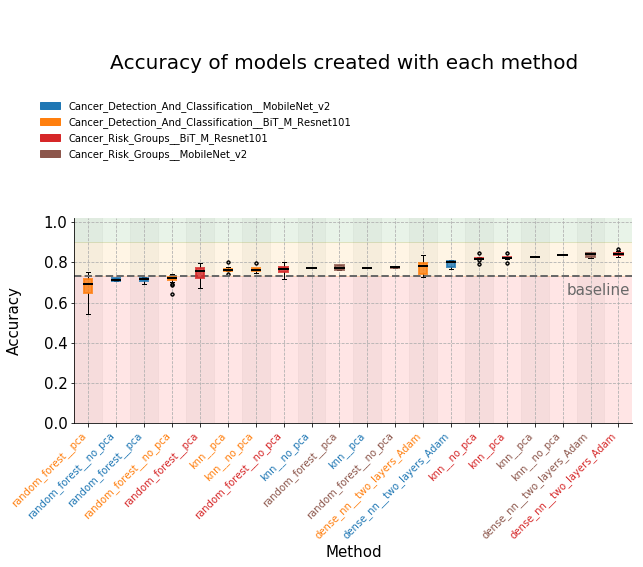

In [4]:
summary_df = prepare_summary_df(
        dataset_name         = DATASET_NAME,
        dataset_variants     = DATASET_VARIANTS,
        module_names         = list(TFHUB_MODELS.keys()),
        ai_methods           = list(MODEL_PARAMETERS_GRID.keys()),
        keywords             = ["summary_table.csv"],
        path_results         = PATH_results,
        verbose=False                            
)

fig = create_boxplot_with_color_classes(summary_df=summary_df, baseline=summary_df.baseline_acc_test.iloc[0]); fig.show()

## show table with accuracy results for n best performing models of each type 

In [5]:
sorted_best_methods_summary_df = preapre_table_with_n_best_results_in_each_group(
    summary_df = summary_df,              
    n_top_methods = 1,
    display_table=True
)

,dataset_variant,module,method,method_variant,model_acc_train,model_acc_valid,model_acc_test,baseline_acc_test,pca_components_used,run_name
0,Cancer_Risk_Groups,BiT_M_Resnet101,dense_nn,two_layers_Adam,0.890257,0.867521,0.861789,0.737127,0,all_data__run01
1,Cancer_Risk_Groups,BiT_M_Resnet101,knn,no_pca,0.888590,0.847503,0.837398,0.737127,0,all_data__run01
2,Cancer_Risk_Groups,MobileNet_v2,dense_nn,two_layers_Adam,0.877750,0.846154,0.821138,0.737127,0,all_data__run01
3,Cancer_Risk_Groups,BiT_M_Resnet101,knn,pca,0.889167,0.844130,0.845528,0.737127,250,all_data__run01
4,Cancer_Detection_And_Classification,BiT_M_Resnet101,dense_nn,two_layers_Adam,0.858863,0.837272,0.833787,0.730245,0,all_data__run01
5,Cancer_Risk_Groups,MobileNet_v2,knn,no_pca,0.847027,0.834683,0.813008,0.737127,0,all_data__run01
6,Cancer_Risk_Groups,MobileNet_v2,knn,pca,0.855686,0.827935,0.813008,0.737127,250,all_data__run01
7,Cancer_Detection_And_Classification,MobileNet_v2,dense_nn,two_layers_Adam,0.875521,0.811614,0.782016,0.730245,0,all_data__run01
8,Cancer_Detection_And_Classification,BiT_M_Resnet101,knn,pca,0.839708,0.802836,0.801090,0.730245,250,all_data__run01
9,Cancer_Risk_Groups,BiT_M_Resnet101,random_forest,no_pca,0.964262,0.800270,0.788618,0.737127,0,small_subset_data__run01


# Show Predictions made with the best performing model for test data
---

* The best model was selected using validation accuracy, from all compared models in that section, 
* border colors arround each picture show true class of that image (see legend, for class-color pairs),
* the groups of images (labelled on top of each group), show classyfication made by the model,
* the probability values displayed on each image were calculated using model.predict_proba() function, 
* Predictions in each group were summarized, on pie plots below the main figure, 
* you may double click on the image to make it larger, 

Found 369 images belonging to 3 classes.


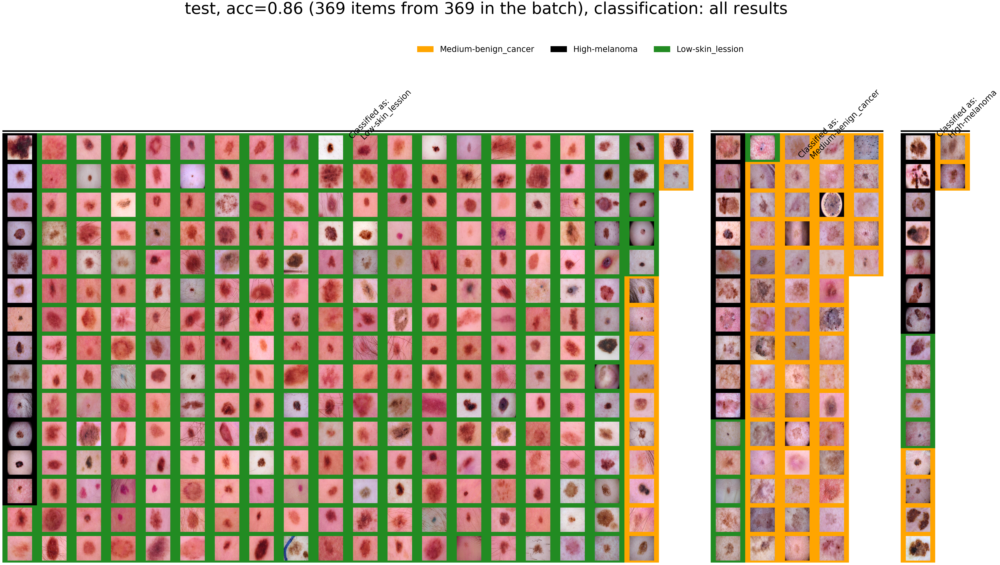

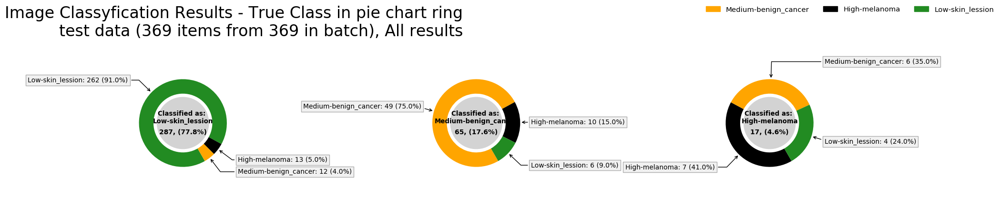

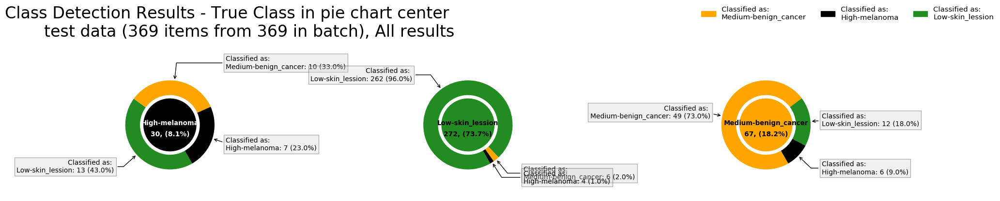

In [6]:
simple_visual_model_summary(
    model_idx_in_sorted_summary_df= 0, # idx in sorted_best_methods_summary_df, not model ID that is repeated in each model search group
    subset_collection_name        = "test",
    batch_names_list              = ["test_01"],
    summary_df                    = sorted_best_methods_summary_df,
    class_labels_configs          = CLASS_LABELS_CONFIGS,
    path_data                     = PATH_interim,
    path_results                  = PATH_results,   
    N_displayed_images            ="all",
    max_img_per_col               = 15
)